In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time

In [2]:
plt.rcParams.update({'font.size': 15})

In [3]:
run /home/lmberkhout/src/pychfpga/pychfpga/sifpga_crs_corr_capture.py

Enabling nested event loop on current loop ID 130875239234768
Adding new log handlers of <Logger pychfpga (WARNING)> with level debug
Opened TCPipe socket at ('10.10.10.33', 47068)


There are no IceCrates in the hardware map!


+--------------+-----------------+
| Standalone   | Virt. slot None |
| Motherboards | CRS_SN0032      |
|              | 10.10.10.106    |
+--------------+-----------------+
| Mezz1        | -               |
| Mezz2        | -               |
+--------------+-----------------+

Forcing output 0 mode to LVPECL because fout is high
Forcing output 8 mode to LVPECL because fout is high
Forcing output 9 mode to LVPECL because fout is high
Forcing output 10 mode to LVPECL because fout is high
Forcing output 11 mode to LVPECL because fout is high
Forcing output 12 mode to LVPECL because fout is high
TCPipe: Programming FPGA with 34437356 bytes


chFPGA(None, 'CRS_SN0032'): Sync is not yet implemented on the CRS
chFPGA(None, 'CRS_SN0032'): Sync is not yet implemented on the CRS
chFPGA(None, 'CRS_SN0032'): There is no 1st CROSSBAR module in this firmware build (so there can't be data streamed to the correlators or GPU links!)
chFPGA(None, 'CRS_SN0032'): There is no 2nd CROSSBAR module in this firmware build
chFPGA(None, 'CRS_SN0032'): There is no 3rd CROSSBAR module in this firmware build
{self!r}: Cannot set data width on UltraCT. Command is ignored. 
{self!r}: set_frames_per_packet is not implemented on UltraCT. Packet size is set through the playlist. Command is ignored. 
The platform does not support SYNC sources
chFPGA(None, 'CRS_SN0032'): Sync is not yet implemented on the CRS
chFPGA(None, 'CRS_SN0032'): Sync is not yet implemented on the CRS
FPGAArray(1_boards,0_crates): SYNC will not be checked as not all firmware have SYNC logic
chFPGA(None, 'CRS_SN0032'): Sync is not yet implemented on the CRS


-------------- CHAN[0].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x3FFF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[1].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x3FFF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[2].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x3FFF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[3].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x3FFF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[4].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x3FFF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None


In [4]:
s_per_frame = 2**14*(1/(ccc.fs*1e6)) # samples/frame * seconds/sample. Make sure sampling frequency is in Hz
board_inputs = ['W6Y', 'W6X', 'E6Y', 'E6X', 'M6Y', 'M6X', 'Antenna1', 'Antenna 2'] 

# Long FFT Measurements

In [5]:
for n in range(ccc.NPOLS):
    # Configure each FFT
    fft = ccc.i.chan[n].FFT
    # fft.FFT_SHIFT = 0b11111111111000
    fft.FFT_SHIFT = 0b00011111111111 # reverse the order
    print(fft.status())

-------------- CHAN[0].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x7FF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[1].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x7FF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[2].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x7FF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[3].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x7FF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-------------- CHAN[4].FFT STATUS --------------
 FFT Bypass: False
 FFT SHIFT schedule: 0x7FF
 CASPER block pipeling delay: Measured=12533, set point=12533:  clocks
 Number of FFT overflows: 0
None
-----

In [6]:
n_fft_integrations = 500 # 30
n_fft_captures = 10
fft_integration_period = 2*n_fft_captures*s_per_frame # we capture two contiguous frames at a time, so we recover twice as many frames as captures
print(fft_integration_period)

0.0001024


In [7]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 64 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing 

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 319 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 292 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 319 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 271 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 265 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 285 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

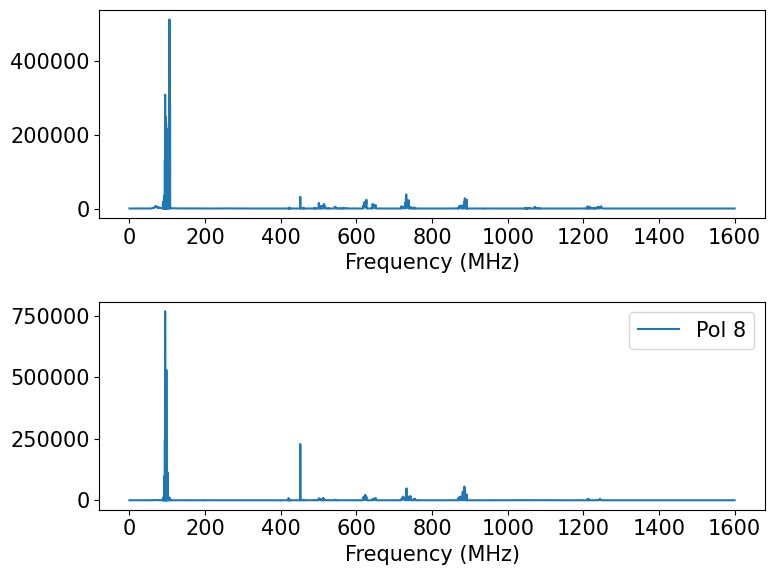

In [8]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

/tmp/ipykernel_883836/1350809797.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 2, n + 1)


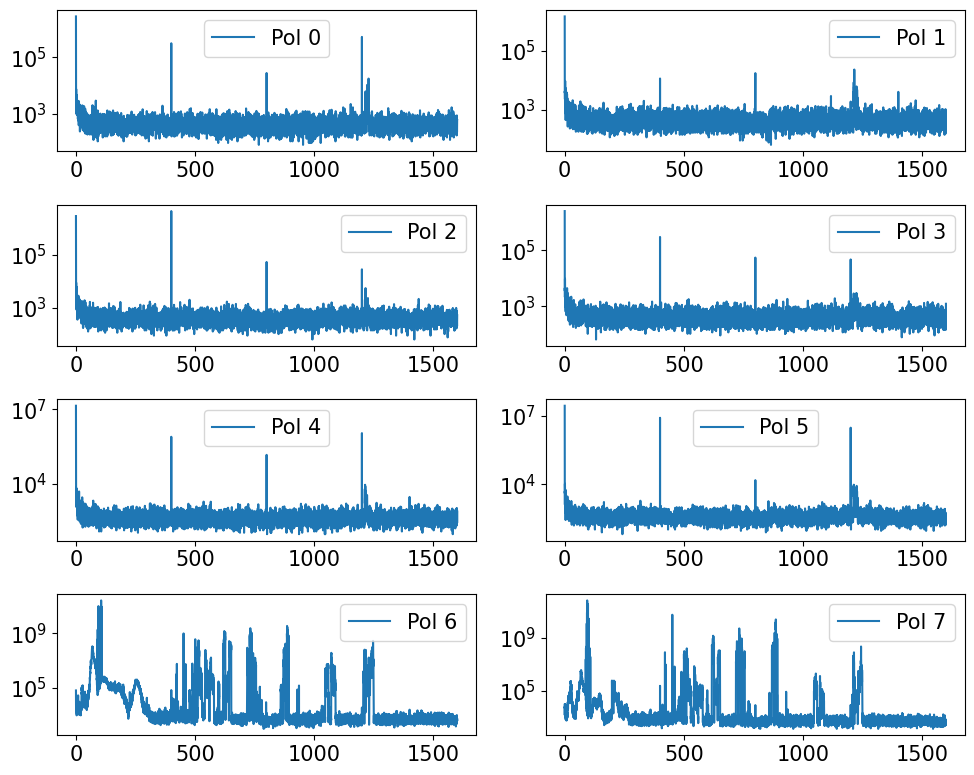

In [9]:
plt.figure(figsize = (10, 8))
plt.title('Integrated PSDs from Firmware FFTs')
for n in range(8):
    plt.subplot(4, 2, n + 1)
    plt.semilogy(ccc.f, kert_fft[0, n], label = f'Pol {n}')
    plt.legend()
plt.tight_layout()

/tmp/ipykernel_883836/1924792000.py:7: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, n, :]))


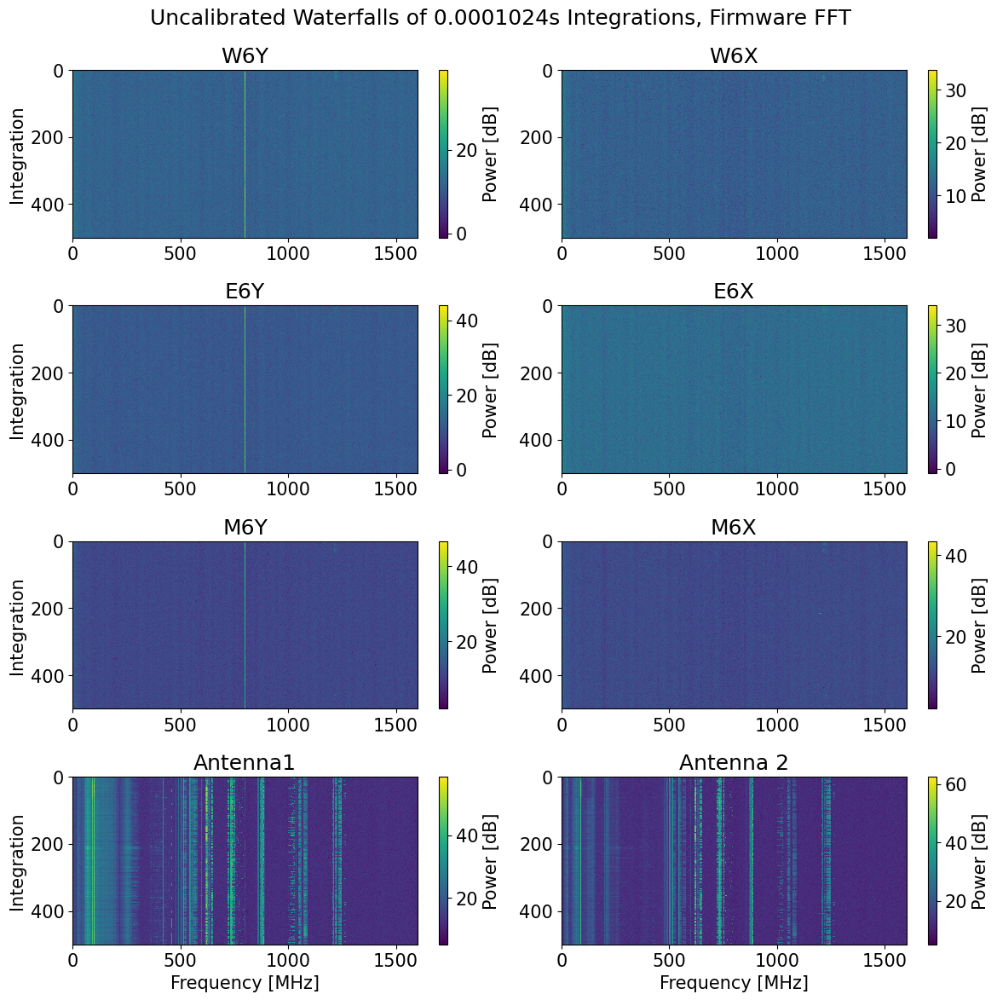

In [10]:
plt.figure(figsize = (12, 12))
plt.suptitle(f'Uncalibrated Waterfalls of {fft_integration_period}s Integrations, Firmware FFT')

for n in range(ccc.NPOLS):
    plt.subplot(4, 2, n + 1)
    plt.title(f'{board_inputs[n]}')
    plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, n, :]))
    plt.colorbar(label = 'Power [dB]')
    if n == 0 or n == 2 or n == 4 or n == 6:
        plt.ylabel('Integration')
    if n == 6 or n== 7:
        plt.xlabel('Frequency [MHz]')
    plt.gca().invert_yaxis()
    plt.tight_layout()

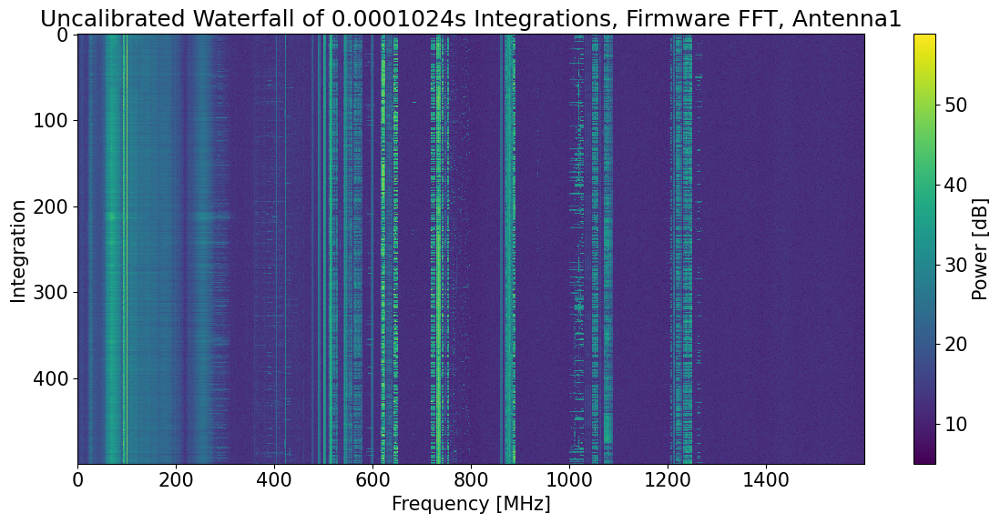

In [11]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

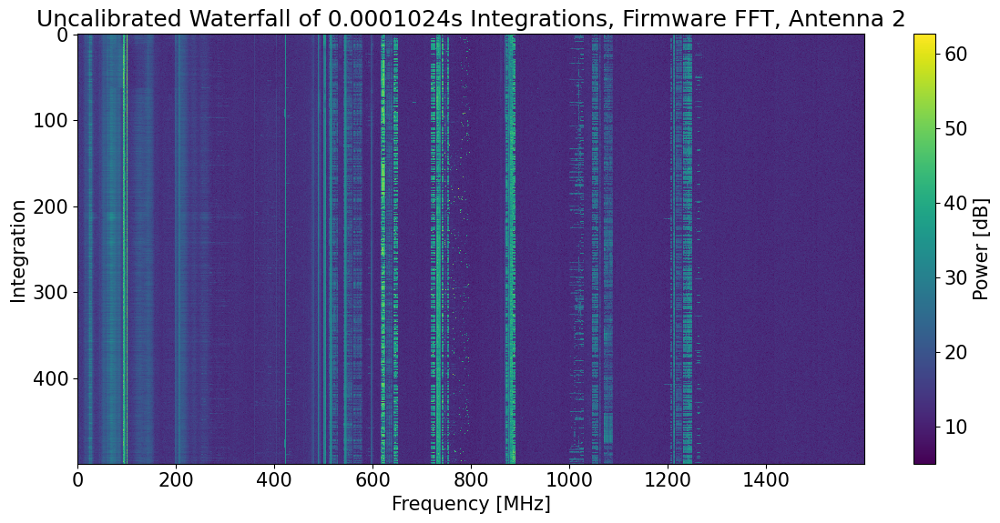

In [12]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# Zoom in on the guy

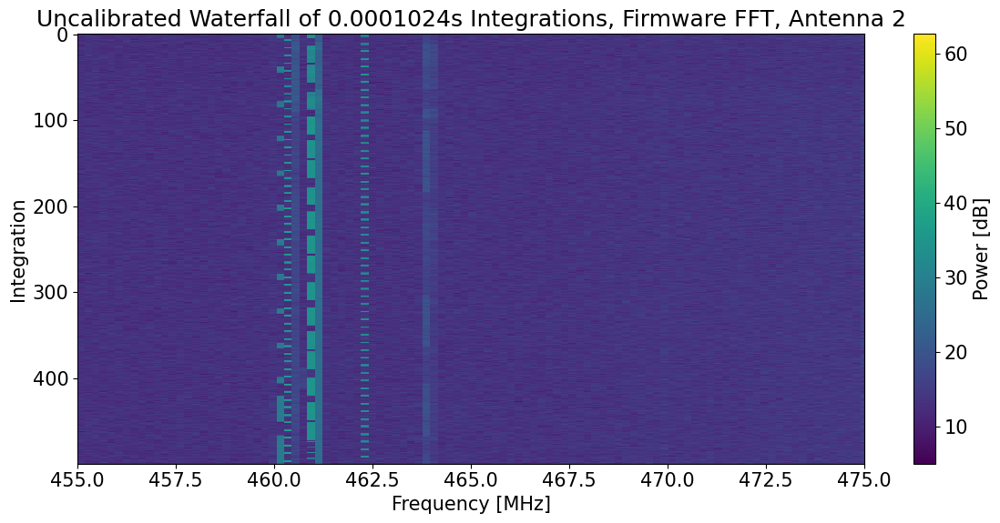

In [13]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
plt.xlim(455, 475)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# Move antennas closer to the window

In [14]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 15823 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missi

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

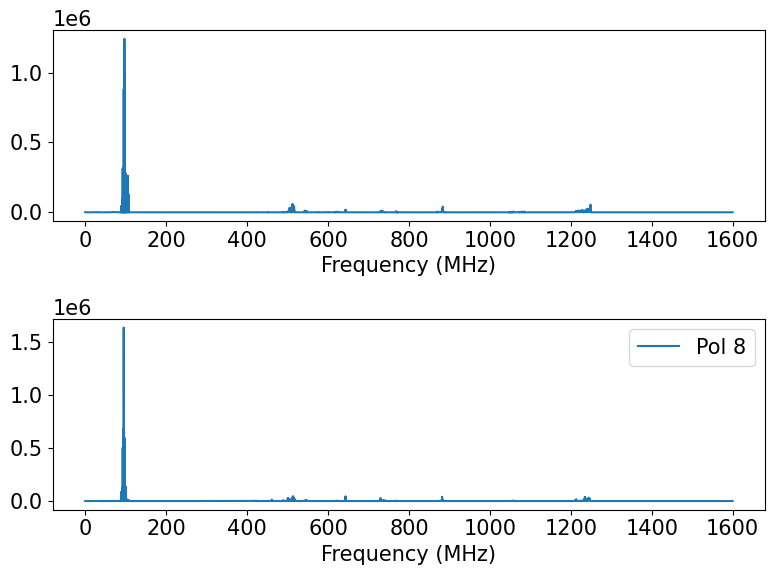

In [15]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

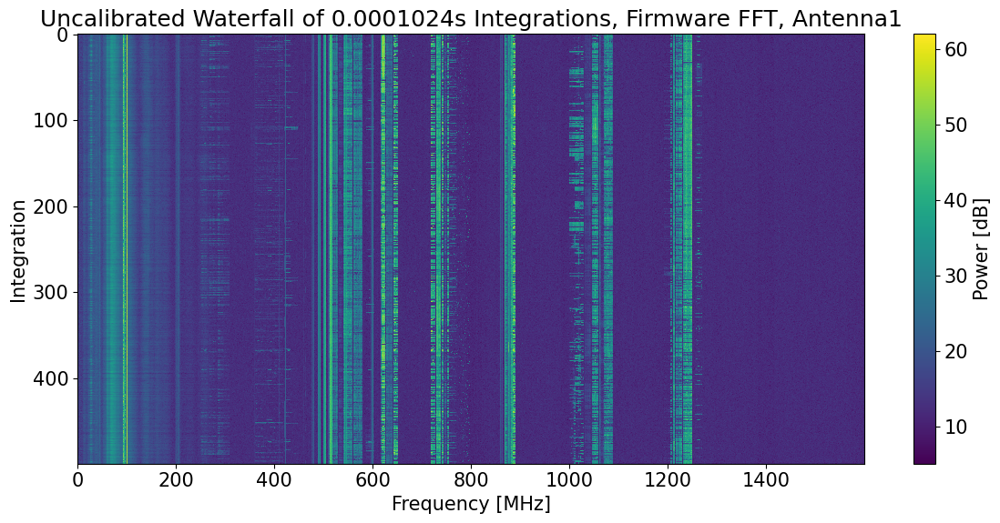

In [16]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

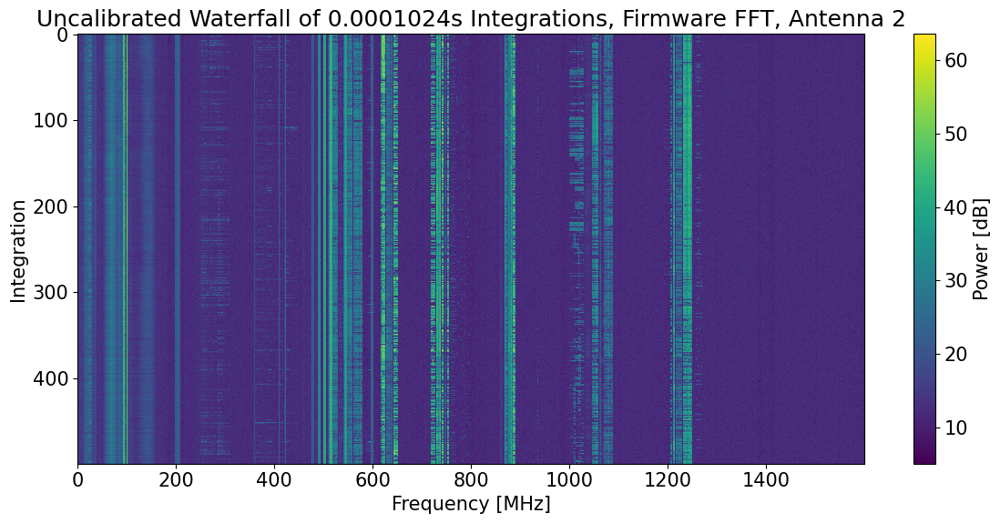

In [17]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# Move back closer, pol 6 now turned 90 deg

In [19]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 15828 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missi

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 319 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

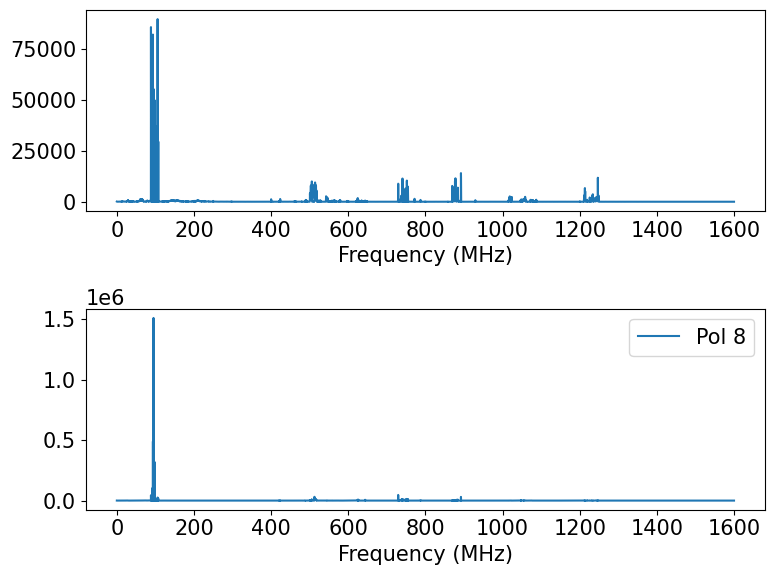

In [20]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

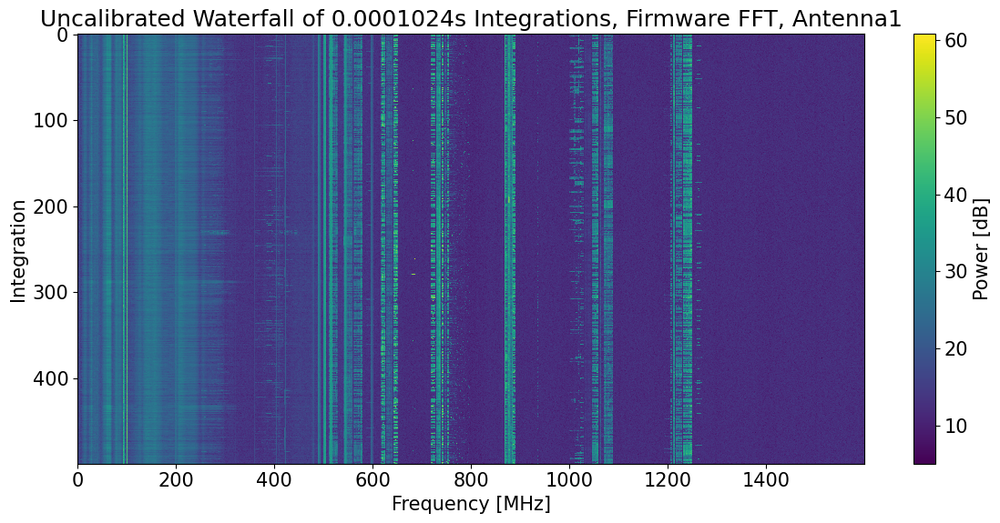

In [21]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

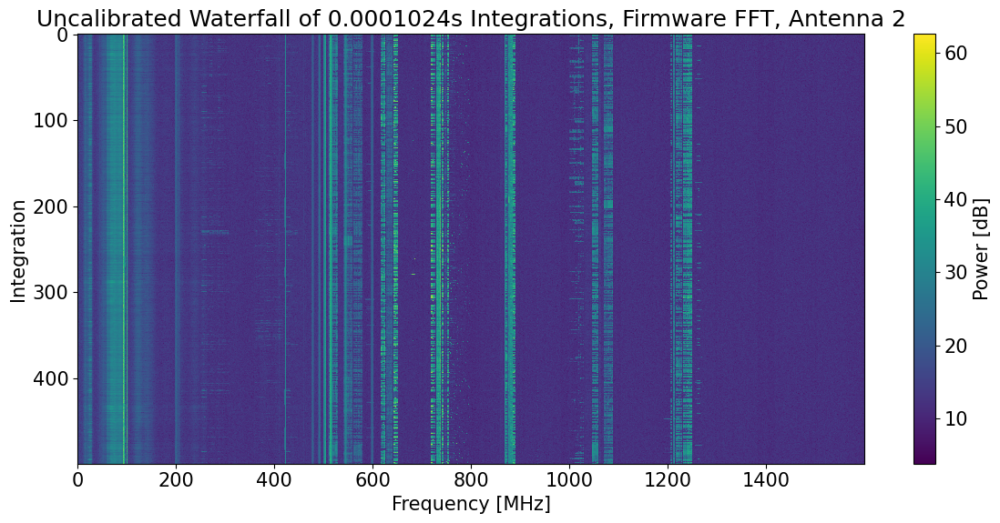

In [22]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# Pol 6 now rotated vertically

In [23]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 15818 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missi

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

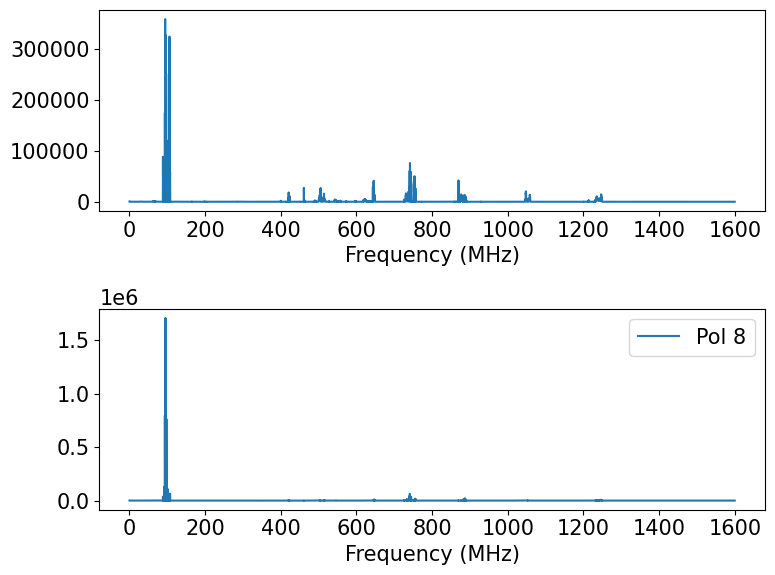

In [24]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

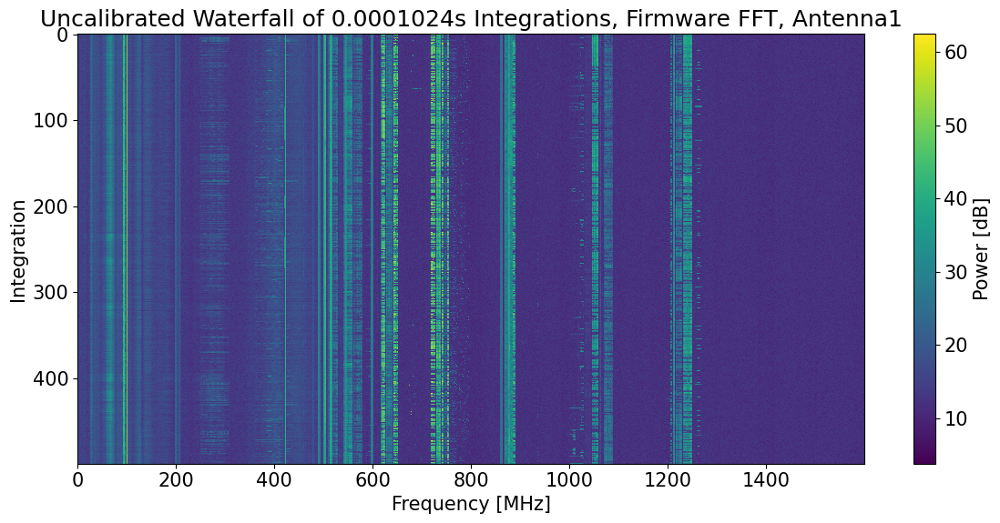

In [26]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

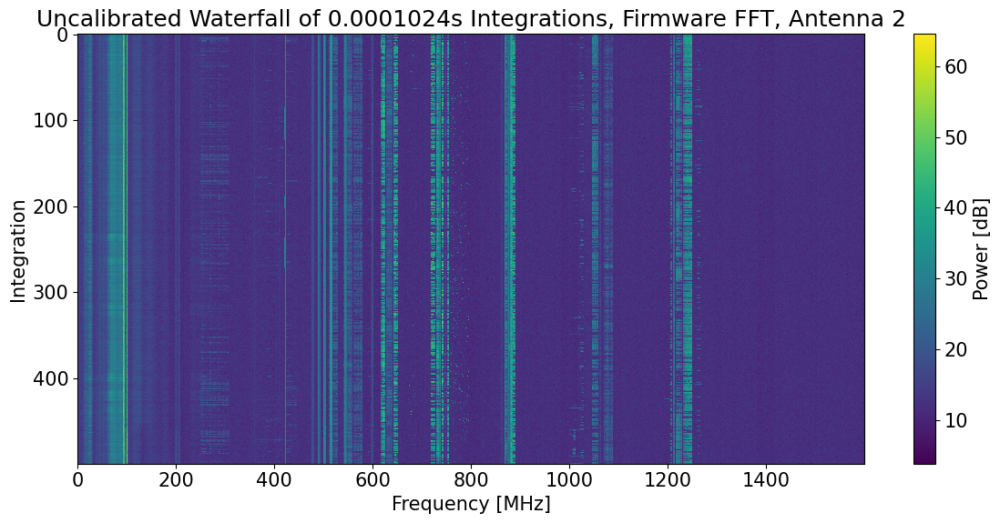

In [27]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# move both to be directional to back window

In [28]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 15818 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missi

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

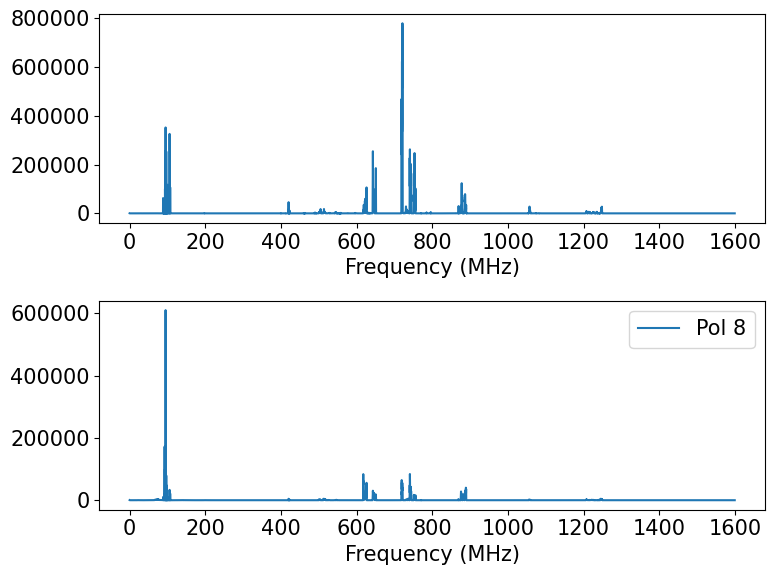

In [33]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

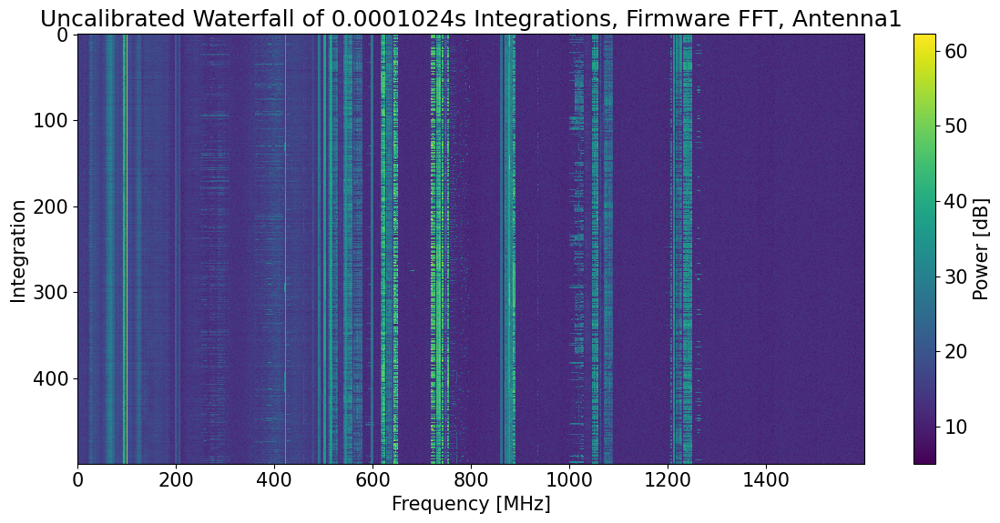

In [30]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

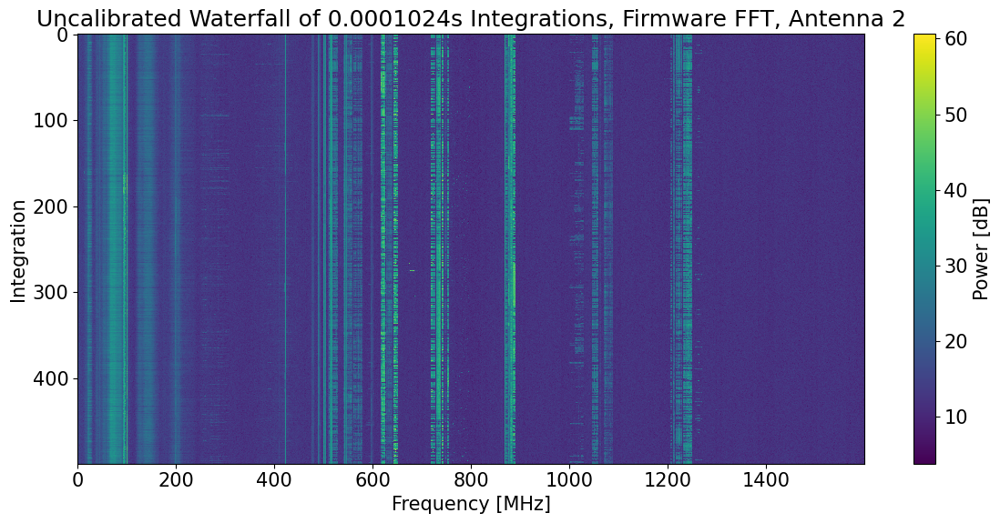

In [31]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

# Same orientation, move closer to back window

In [34]:
psd_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
kert_fft = np.zeros((n_fft_integrations, ccc.NPOLS, len(ccc.f)))
fft_cap_adc_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))
# fft_cap_adc_rms_power_dBm = np.zeros((n_adc_integrations, ccc.NPOLS))
fft_cap_fft_ovflws = np.zeros((n_fft_integrations, ccc.NPOLS))

for n in range(n_fft_integrations):
    print(f'{n}/{n_fft_integrations}')
    
    # Pulse the overflows resets
    for m in range(ccc.NPOLS):

        # Reset ADC stats capture (which is actually in the Scaler module)
        ccc.i.chan[m].SCALER.STATS_FRAME_COUNT = n_fft_captures
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 0 # capture new stats
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        ccc.i.chan[m].SCALER.STATS_CAPTURE = 1
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)

        # Reset FFT overflow counter
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 1 
        ccc.i.chan[m].FFT.OVERFLOW_RESET = 0

    # Capture data
    d_fft = ccc.read_fft_frames(ncap = n_fft_captures)
    psd_fft[n] = np.mean(np.abs(d_fft)**2, axis = 1)
    kert_fft[n] = np.mean(np.abs(d_fft)**4, axis = 1)

    # Measure ADC overflows
    for m in range(ccc.NPOLS):
        print('---')
        # print(m, ccc.i.chan[m].SCALER.STATS_CAPTURE)
        # print(ccc.i.chan[m].SCALER.STATS_READY)
        ctr = 0
        while True:
            if ccc.i.chan[m].SCALER.STATS_READY == 1:
                print(f'stats ready after {ctr} cycles')
                fft_cap_adc_ovflws[n, m] = ccc.i.chan[m].SCALER.STATS_ADC_OVERFLOWS
                break
            else:
                ctr += 1
                
    # Measure FFT overflows
    fft_cap_fft_ovflws[n] = [ccc.i.chan[m].FFT.OVERFLOW_COUNT for m in range(ccc.NPOLS)]

0/500
Flushed 15823 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
1/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missi

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
13/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
25/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
37/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
49/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
61/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
73/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
85/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
97/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles


Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
109/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
121/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
133/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
145/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
157/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
169/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
181/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
193/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
205/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
217/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
229/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
241/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
253/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
265/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
277/500
Flushed 271 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
289/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
301/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
313/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
325/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
337/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
349/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
361/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
373/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
385/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
397/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
409/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
421/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
433/500
Flushed 257 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
445/500
Flushed 319 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
457/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
469/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
481/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
---
stats ready after 0 cycles
493/500
Flushed 255 packets while emptying UDP buffers
Skipped 65 packets while waiting for a fresh timestamp
mode=0, 8 channel(s), 2 frames per channel, 10 captures
Chan 0: -560.0 missing packets
Chan 1: -560.0 missing packets
Chan 2: -560.0 missing packets
Chan 3: -560.0 missing packets
Chan 4: -560.0 missing packets
Chan 5: -560.0 missing packets
Chan 6: -560.0 missing packets
Chan 7: -560.0 missing packets
Timestamp differences: {3906}
---
stats ready after 0 cycles

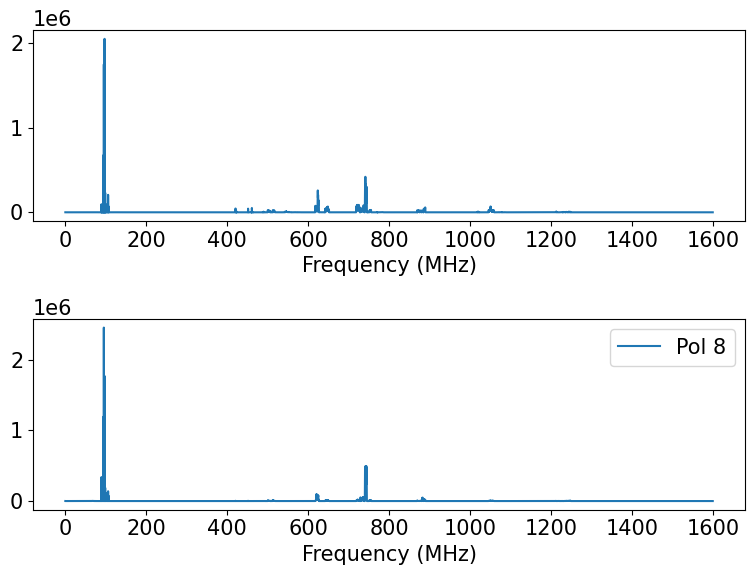

In [35]:
fig, ax = plt.subplots(2, figsize = (8, 6))
ax[0].plot(ccc.f, psd_fft[0, 6], label = f'Pol {7}')
ax[1].plot(ccc.f, psd_fft[0, 7], label = f'Pol {8}')
ax[0].set_xlabel('Frequency (MHz)')
ax[1].set_xlabel('Frequency (MHz)')
plt.legend()
plt.tight_layout()

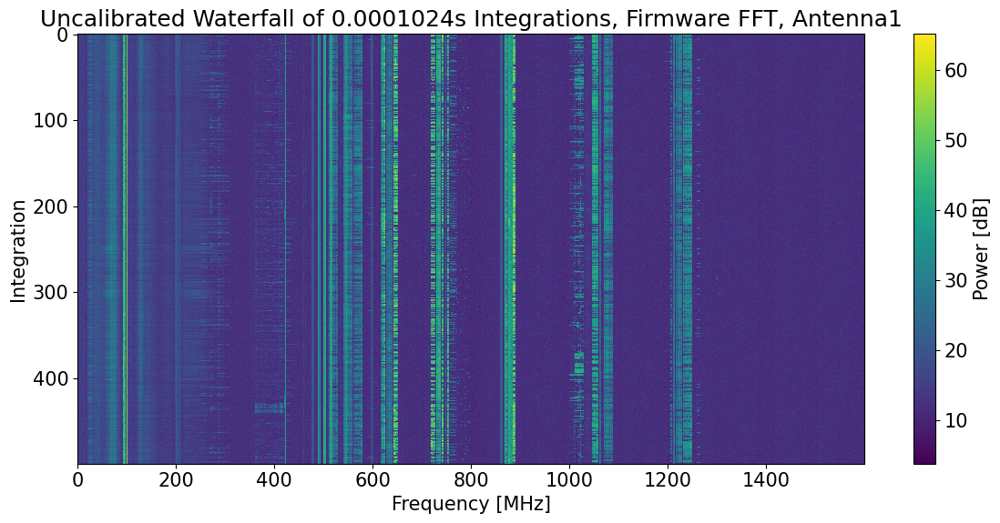

In [36]:
# Zoom in on a given input
pol = 6

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()

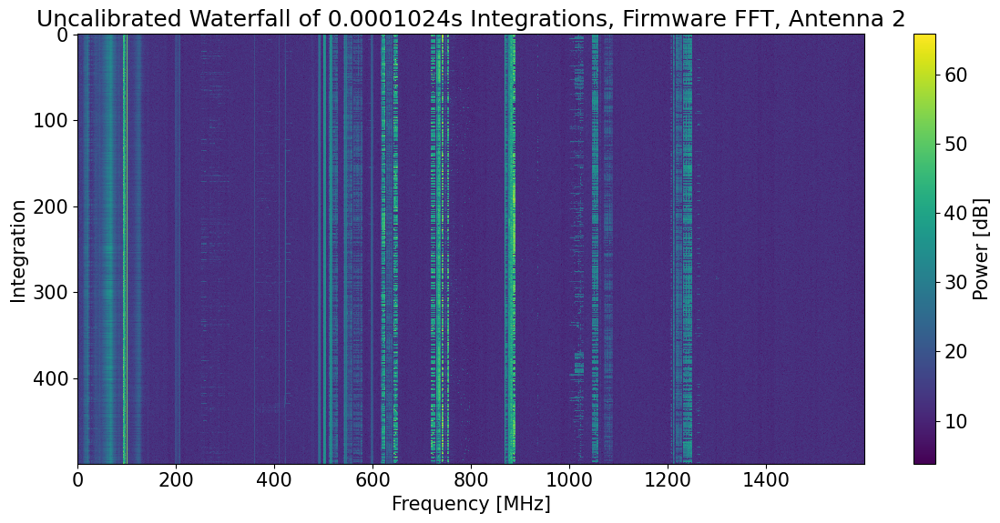

In [37]:
# Zoom in on a given input
pol = 7

plt.figure(figsize = (12, 6))
plt.title(f'Uncalibrated Waterfall of {fft_integration_period}s Integrations, Firmware FFT, {board_inputs[pol]}')
plt.pcolormesh(ccc.f, np.arange(n_fft_integrations), 10*np.log10(psd_fft[:, pol, :]))
plt.colorbar(label = 'Power [dB]')
# plt.xlim(700, 725)
plt.ylabel('Integration')
plt.xlabel('Frequency [MHz]')
plt.gca().invert_yaxis()
plt.tight_layout()